# Plotting Nonlinearity results

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
# importing the libraries

%matplotlib inline
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import xarray as xr
import netCDF4
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

In [3]:
from scipy import stats

In [4]:
import seaborn as sns

In [5]:
mpl.rcParams['font.family'] = 'Droid Sans'
mpl.rcParams['font.size'] = 12
# Edit axes parameters
mpl.rcParams['axes.linewidth'] = 1.5
# Tick properties
mpl.rcParams['xtick.major.size'] = 5
mpl.rcParams['xtick.minor.size'] = 3
mpl.rcParams['xtick.major.width'] = 1
mpl.rcParams['xtick.direction'] = 'out'
mpl.rcParams['ytick.major.size'] = 5
mpl.rcParams['ytick.minor.size'] = 3
mpl.rcParams['ytick.major.width'] = 1
mpl.rcParams['ytick.direction'] = 'out'

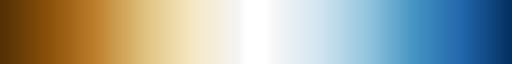

In [6]:
n = 35
diff = 0.5
cmap = plt.cm.BrBG
cmap2 = plt.cm.RdBu
lower = cmap(np.linspace(0, diff, n))
white = np.ones((2, 4))
upper = cmap2(np.linspace(1-diff, 1, n))
colors = np.vstack((lower, white, white, upper))
BrBU = mpl.colors.LinearSegmentedColormap.from_list('map_white', colors)
BrBU

In [7]:
out = xr.open_dataset('./data/result/out_conc.nc')
out

<xarray.Dataset>
Dimensions:      (model: 52, region: 46, season: 5)
Coordinates:
  * model        (model) object 'ACCESS-CM2' 'ACCESS-ESM1-5' ... 'obs' 'rean'
  * region       (region) object 'Greenland/Iceland' ... 'W.Antarctica'
  * season       (season) object 'ANN' 'DJF' 'MAM' 'JJA' 'SON'
Data variables: (12/13)
    std_dev      (model, region, season) float64 ...
    clim         (model, region, season) float64 ...
    corr_coef    (model, region, season) float64 ...
    pval         (model, region, season) float64 ...
    nino         (model, region, season) float64 ...
    nina         (model, region, season) float64 ...
    ...           ...
    enc_pval     (model, region, season) float64 ...
    lnc_pval     (model, region, season) float64 ...
    en_events    (model, season) float64 ...
    ln_events    (model, season) float64 ...
    neut_events  (model, season) float64 ...
    threshold    (model) float64 ...

In [8]:
out.model

<xarray.DataArray 'model' (model: 52)>
array(['ACCESS-CM2', 'ACCESS-ESM1-5', 'AWI-CM-1-1-MR', 'AWI-ESM-1-1-LR',
       'BCC-CSM2-MR', 'BCC-ESM1', 'CAMS-CSM1-0', 'CAS-ESM2-0', 'CESM2',
       'CESM2-FV2', 'CESM2-WACCM', 'CESM2-WACCM-FV2', 'CMCC-CM2-HR4',
       'CMCC-CM2-SR5', 'CNRM-CM6-1', 'CNRM-CM6-1-HR', 'CNRM-ESM2-1', 'CanESM5',
       'E3SM-1-1', 'E3SM-1-1-ECA', 'EC-Earth3', 'EC-Earth3-Veg',
       'EC-Earth3-Veg-LR', 'FGOALS-f3-L', 'FGOALS-g3', 'GFDL-CM4', 'GFDL-ESM4',
       'GISS-E2-1-G', 'GISS-E2-1-G-CC', 'GISS-E2-1-H', 'HadGEM3-GC31-LL',
       'HadGEM3-GC31-MM', 'IITM-ESM', 'INM-CM4-8', 'INM-CM5-0', 'IPSL-CM6A-LR',
       'KACE-1-0-G', 'MIROC-ES2L', 'MIROC6', 'MPI-ESM-1-2-HAM',
       'MPI-ESM1-2-HR', 'MPI-ESM1-2-LR', 'MRI-ESM2-0', 'NESM3', 'NorCPM1',
       'NorESM2-LM', 'NorESM2-MM', 'SAM0-UNICON', 'TaiESM1', 'UKESM1-0-LL',
       'obs', 'rean'], dtype=object)
Coordinates:
  * model    (model) object 'ACCESS-CM2' 'ACCESS-ESM1-5' ... 'obs' 'rean'

In [9]:
model_colors = ['lightcoral', 'indianred', 'tab:brown', 'firebrick', 'maroon', 'red', 'salmon',
                'tab:red', 'sienna', 'chocolate', 'saddlebrown', 'sandybrown', 'darkorange',
                'orange', 'darkgoldenrod', 'goldenrod', 'gold', 'darkkhaki', 'olive', 'yellow',
                'olivedrab', 'tab:green', 'darkolivegreen', 'green', 'limegreen', 'lightseagreen', 'tab:cyan',
                'teal', 'skyblue', 'steelblue', 'tab:blue', 'lightsteelblue', 'royalblue',
                'darkblue', 'blue', 'slateblue', 'mediumpurple', 'indigo', 'darkviolet',
                'plum', 'violet', 'darkmagenta', 'magenta', 'orchid',
                'mediumvioletred', 'deeppink', 'hotpink', 'palevioletred', 'crimson',
                'pink', 'k', 'k']
len(model_colors)

52

In [10]:
out['enc'] = out.nino - out.neut
out['lnc'] = out.nina - out.neut
out['asymm'] = (out.enc + out.lnc)/2
out['symm'] = (out.enc - out.lnc)/2

In [11]:
import os
model_list = sorted(os.listdir('/scratch/ob22/as8561/data/preproc//'))[1:]

In [12]:
model_list

['obs']

In [13]:
# def plot_scatter(da, var):
#     for j in range(len(da.model)):
#         if da.model[j] == 'obs' or da.model[j] == 'rean':
#             (da.isel(model = j)[var]).drop(['model', 'region']).plot.scatter(color = model_colors[j], marker = 'D', alpha = 0.9, s = 80, facecolor='white', label = model_list[j])
#         else:
#             (da.isel(model = j)[var]).drop(['model', 'region']).plot.scatter(color = model_colors[j], marker = 'o', alpha = 0.4, s = 10, facecolor='white', label = model_list[j])
#     (da.isel(model = slice(0, -2))[var]).mean('model').drop(['region']).plot.scatter(color = 'tab:red', marker='D', alpha = 0.9, s = 80, facecolor='white', label = 'mme')

### creating mme dataset

In [14]:
def get_sig1d(x):
    sig_models = len(x[x < 0.05])
    tot_models = len(x)
    return float(sig_models/tot_models)


def get_sign3d(da, dim):
    return xr.apply_ufunc(get_sig1d, da, input_core_dims=[[dim]], vectorize=True, dask='parallelized')

In [15]:
out

<xarray.Dataset>
Dimensions:      (model: 52, region: 46, season: 5)
Coordinates:
  * model        (model) object 'ACCESS-CM2' 'ACCESS-ESM1-5' ... 'obs' 'rean'
  * region       (region) object 'Greenland/Iceland' ... 'W.Antarctica'
  * season       (season) object 'ANN' 'DJF' 'MAM' 'JJA' 'SON'
Data variables: (12/17)
    std_dev      (model, region, season) float64 ...
    clim         (model, region, season) float64 ...
    corr_coef    (model, region, season) float64 ...
    pval         (model, region, season) float64 ...
    nino         (model, region, season) float64 ...
    nina         (model, region, season) float64 ...
    ...           ...
    neut_events  (model, season) float64 ...
    threshold    (model) float64 ...
    enc          (model, region, season) float64 0.3218 0.01204 ... 0.02449
    lnc          (model, region, season) float64 -0.09092 -0.1126 ... -0.08654
    asymm        (model, region, season) float64 0.1155 -0.05029 ... -0.03103
    symm         (model, region, season) float64 0.2064 0.06233 ... 0.05551

In [16]:
mme_ds = out.isel(model = slice(0,-2)).drop(['pval', 'enc_pval', 'lnc_pval']).mean('model')
# mme_ds = out.isel(model = slice(0,-2)).drop(['pval', 'enc_pval', 'lnc_pval']).drop([model_list[17], model_list[27]], dim='model').mean('model')

In [17]:
mme_ds['sign_ratio'] = get_sign3d(out.isel(model = slice(0,-2)).pval, dim='model')
mme_ds['enc_sign_ratio'] = get_sign3d(out.isel(model = slice(0,-2)).enc_pval, dim='model')
mme_ds['lnc_sign_ratio'] = get_sign3d(out.isel(model = slice(0,-2)).lnc_pval, dim='model')

In [18]:
mme_ds

<xarray.Dataset>
Dimensions:         (region: 46, season: 5)
Coordinates:
  * region          (region) object 'Greenland/Iceland' ... 'W.Antarctica'
  * season          (season) object 'ANN' 'DJF' 'MAM' 'JJA' 'SON'
Data variables: (12/17)
    std_dev         (region, season) float64 3.419 9.275 8.405 ... 10.52 10.3
    clim            (region, season) float64 35.1 30.2 28.72 ... 41.37 35.95
    corr_coef       (region, season) float64 0.0153 0.04729 ... 0.05112 0.04147
    nino            (region, season) float64 0.001959 0.02153 ... 0.06106
    nina            (region, season) float64 -0.0533 -0.07093 ... -0.02303
    neut            (region, season) float64 -0.002806 0.01157 ... -0.02013
    ...              ...
    lnc             (region, season) float64 -0.0505 -0.0825 ... -0.002906
    asymm           (region, season) float64 -0.02287 -0.03627 ... 0.03914
    symm            (region, season) float64 0.02763 0.04623 ... 0.02985 0.04205
    sign_ratio      (region, season) float64 0.1 0.24 0.22 0.04 ... 0.24 0.2 0.2
    enc_sign_ratio  (region, season) float64 0.04 0.04 0.06 ... 0.1 0.14 0.22
    lnc_sign_ratio  (region, season) float64 0.06 0.12 0.08 ... 0.02 0.06 0.02

In [19]:
import seaborn as sns

In [20]:
import regionmask

In [21]:
region_names = regionmask.defined_regions.ar6.land.to_dataframe()['names'].to_numpy()
region_names

array(['Greenland/Iceland', 'N.W.North-America', 'N.E.North-America',
       'W.North-America', 'C.North-America', 'E.North-America',
       'N.Central-America', 'S.Central-America', 'Caribbean',
       'N.W.South-America', 'N.South-America', 'N.E.South-America',
       'South-American-Monsoon', 'S.W.South-America', 'S.E.South-America',
       'S.South-America', 'N.Europe', 'West&Central-Europe', 'E.Europe',
       'Mediterranean', 'Sahara', 'Western-Africa', 'Central-Africa',
       'N.Eastern-Africa', 'S.Eastern-Africa', 'W.Southern-Africa',
       'E.Southern-Africa', 'Madagascar', 'Russian-Arctic', 'W.Siberia',
       'E.Siberia', 'Russian-Far-East', 'W.C.Asia', 'E.C.Asia',
       'Tibetan-Plateau', 'E.Asia', 'Arabian-Peninsula', 'S.Asia',
       'S.E.Asia', 'N.Australia', 'C.Australia', 'E.Australia',
       'S.Australia', 'New-Zealand', 'E.Antarctica', 'W.Antarctica'],
      dtype=object)

In [22]:
save_loc = './images/regional/'

In [23]:
# plotting code
import matplotlib as m
from matplotlib.colors import BoundaryNorm as BM


def plot_background(ax):
    ax.add_feature(cfeature.COASTLINE, alpha=0.9, lw=1.1)
    ax.set_global()
    # ax.add_feature(cfeature.LAND, color='lightgray')
    # ax.add_feature(cfeature.OCEAN, color='lightgray')
    gl = ax.gridlines(draw_labels=True,
                      linewidth=1, color='gray', alpha=0.01, linestyle='--')
    gl.top_labels = False
    # gl.left_labels = False
    # gl.bottom_labels = False
    gl.right_labels = False
    gl.xlines = False
    # gl.xlocator = mticker.FixedLocator([-180, -45, 0, 45, 180])
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': 10, 'color': 'k'}
    gl.ylabel_style = {'size': 10, 'color': 'k'}
    return ax

# plotting function for the case of general pval
def plot(z, titles, labels, cmap, vmin, vmax, extend='both', cbar_shrink=0.4, cbar_aspect=25, cbar_pad=0.05, cbar_label='Precip', pval = [], \
         nrows=1, ncols=3, figsize=(12,4), ocean_mask_list=[], mme_index_list=[]):
    cmap.set_bad('white',1.)
    pg = regionmask.defined_regions.ar6.land.polygons
    fig, axarr = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, constrained_layout=True, subplot_kw={'projection':ccrs.Robinson(central_longitude=0)})
    
    axlist = axarr.flatten()
    
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    for i in range(len(z)):
        min_val, max_val = min(z[i]), max(z[i])
        # colors = cmap(plt.Normalize(min_val, max_val)(z[i]))
        colors = cmap(plt.Normalize(vmin, vmax)(z[i]))
        
        for j in range(len(z[i])):
            # if pval != [] and pval_mme == []:
            if pval != []:
                if i not in mme_index_list:
                    if pval[i][j] > 0.05:
                        axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='/////')
                    else:
                        axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
                else:
                    if pval[i][j] < 0.52:
                        axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='/////')
                    else:
                        axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
            else:
                axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
        axlist[i].set_title(titles[i], loc='center', y=1.05)
        axlist[i].text(0.1, 1.05, labels[i], size=16, fontweight='bold', transform=axlist[i].transAxes)
        if i in ocean_mask_list:
            axlist[i].add_feature(cfeature.OCEAN, color = 'white', zorder=1)
            
    for ax in axlist:
        plot_background(ax)
        
    plt.colorbar(m.cm.ScalarMappable(norm = norm, cmap=cmap), extend=extend, ax = axlist, \
                orientation = 'vertical', shrink=cbar_shrink, aspect = cbar_aspect, pad = cbar_pad, label = cbar_label)


# plotting function for the case of enc and lnc pval
def plot2(z, titles, labels, cmap, vmin, vmax, extend='both', cbar_shrink=0.4, cbar_aspect=25, cbar_pad=0.05, cbar_label = 'Precip', pval1 = [], pval2=[], \
          nrows=1, ncols=3, figsize=(12,4), ocean_mask_list=[], mme_index_list=[]):
    cmap.set_bad('white',1.)
    pg = regionmask.defined_regions.ar6.land.polygons
    fig, axarr = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, constrained_layout=True, subplot_kw={'projection':ccrs.Robinson(central_longitude=0)})
    
    axlist = axarr.flatten()
    
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    for i in range(len(z)):
        min_val, max_val = min(z[i]), max(z[i])
        # colors = cmap(plt.Normalize(min_val, max_val)(z[i]))
        colors = cmap(plt.Normalize(vmin, vmax)(z[i]))
        
        # change w.r.t main plot fuunction is here
        for j in range(len(z[i])):
            # if pval != [] and pval_mme == []:
            if pval1 != [] or pval2 != []:
                if i not in mme_index_list:
                    if pval1[i][j] > 0.05 and pval2[i][j] > 0.05:
                        axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='/////')
                    else:
                        axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
                else:
                    if pval1[i][j] < 0.52 and pval2[i][j] < 0.52:
                        axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='/////')
                    else:
                        axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
            else:
                axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
        axlist[i].set_title(titles[i], loc='center', y=1.05)
        axlist[i].text(0.1, 1.05, labels[i], size=16, fontweight='bold', transform=axlist[i].transAxes)
        if i in ocean_mask_list:
            axlist[i].add_feature(cfeature.OCEAN, color = 'white', zorder=1)
            
    for ax in axlist:
        plot_background(ax)
        
    plt.colorbar(m.cm.ScalarMappable(norm = norm, cmap=cmap), extend=extend, ax = axlist, \
                orientation = 'vertical', shrink=cbar_shrink, aspect = cbar_aspect, pad = cbar_pad, label = cbar_label)

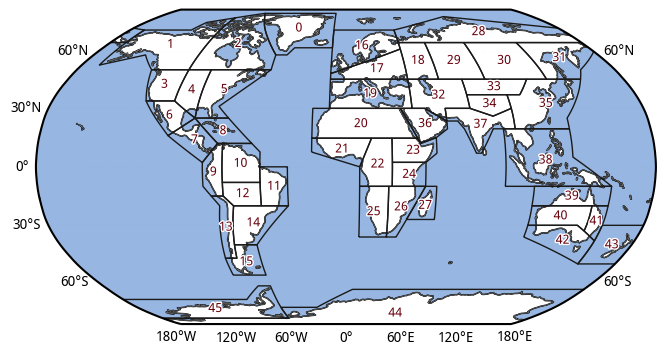

In [24]:
import matplotlib.patheffects as pe

fig = plt.figure(figsize=(8,6))
ax = plt.axes(projection = ccrs.Robinson())
ax.coastlines(lw=0.7, alpha=0.7)
# ax.text(0.1, 1.05, 'a', transform=ax.transAxes, size=16, fontweight='bold')
plot_background(ax)
text_kws = dict(
    bbox=dict(color="none"),
    path_effects=[pe.withStroke(linewidth=2, foreground="w")],
    color="#67000d",
    fontsize=9,
)
regionmask.defined_regions.ar6.land.plot(text_kws=text_kws, label = "number", line_kws=dict(lw=1), add_ocean=True)
plt.savefig(save_loc+'supplementary/regions.png', dpi=300, bbox_inches='tight')

In [25]:
# import matplotlib.patheffects as pe


# plt.figure(figsize=(8,6))
# text_kws = dict(
#     bbox=dict(color="none"),
#     path_effects=[pe.withStroke(linewidth=2, foreground="w")],
#     color="#67000d",
#     fontsize=8,
# )

# ax = regionmask.defined_regions.ar6.land.plot(
#     projection=ccrs.Robinson(), label="abbrev", add_ocean=True, text_kws=text_kws
# )
# # plot_background(ax)

# ax.set_global()

#### Supp figures

#### clim

In [26]:
clim_list = [out.isel(season = 0, model = -2).clim, out.isel(season = 0, model = -1).clim, mme_ds.isel(season=0).clim,
             out.isel(season = 1, model = -2).clim, out.isel(season = 1, model = -1).clim, mme_ds.isel(season=1).clim,
             out.isel(season = 2, model = -2).clim, out.isel(season = 2, model = -1).clim, mme_ds.isel(season=2).clim,
             out.isel(season = 3, model = -2).clim, out.isel(season = 3, model = -1).clim, mme_ds.isel(season=3).clim,
             out.isel(season = 3, model = -2).clim, out.isel(season = 4, model = -1).clim, mme_ds.isel(season=4).clim]

In [27]:
title_list = ['ANN', 'ANN', 'ANN',
              'DJF', 'DJF', 'DJF',
              'MAM', 'MAM', 'MAM',
              'JJA', 'JJA', 'JJA',
              'SON', 'SON', 'SON']

labels_list = ['a', 'b', 'c',
               'd', 'e', 'f',
               'g', 'h', 'i',
               'j', 'k', 'l',
               'm', 'n', 'o']

mme_index_list = [2, 5, 8, 11, 14]

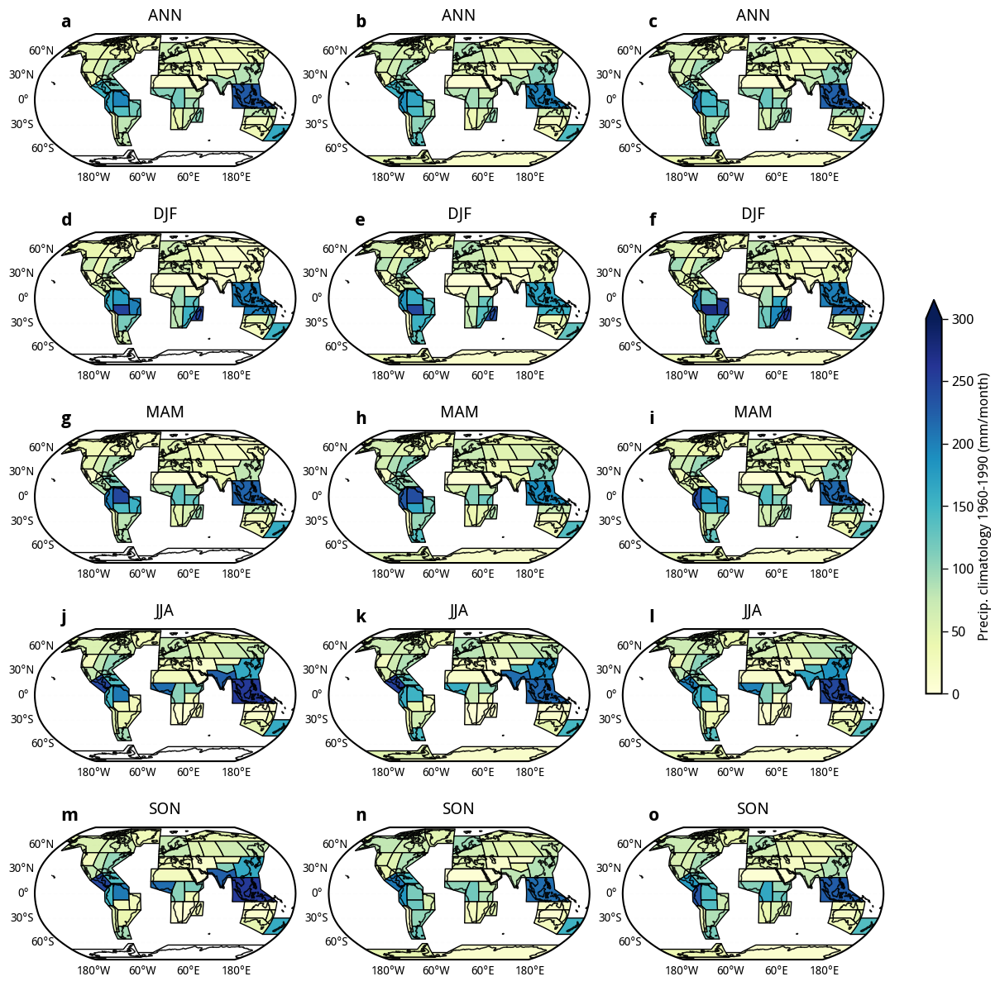

In [29]:
plot(clim_list, title_list, labels_list, mpl.cm.YlGnBu, vmin=0, vmax=300, extend='max', cbar_shrink=0.4, cbar_label = 'Precip. climatology 1960-1990 (mm/month)', pval = [], \
     nrows=5, ncols=3, figsize=(12,12), ocean_mask_list = np.arange(0, 20, 1), mme_index_list=mme_index_list)
plt.savefig(save_loc+'/supplementary/obs_rean_mmm_climatology.png', dpi=300, bbox_inches='tight')

#### std

In [39]:
std_list  = [out.isel(season = 0, model = -2).std_dev, out.isel(season = 0, model = -1).std_dev, mme_ds.isel(season=0).std_dev,
             out.isel(season = 1, model = -2).std_dev, out.isel(season = 1, model = -1).std_dev, mme_ds.isel(season=1).std_dev,
             out.isel(season = 2, model = -2).std_dev, out.isel(season = 2, model = -1).std_dev, mme_ds.isel(season=2).std_dev,
             out.isel(season = 3, model = -2).std_dev, out.isel(season = 3, model = -1).std_dev, mme_ds.isel(season=3).std_dev,
             out.isel(season = 3, model = -2).std_dev, out.isel(season = 4, model = -1).std_dev, mme_ds.isel(season=4).std_dev]

In [40]:
title_list = ['ANN', 'ANN', 'ANN',
              'DJF', 'DJF', 'DJF',
              'MAM', 'MAM', 'MAM',
              'JJA', 'JJA', 'JJA',
              'SON', 'SON', 'SON']

labels_list = ['a', 'b', 'c',
               'd', 'e', 'f',
               'g', 'h', 'i',
               'j', 'k', 'l',
               'm', 'n', 'o']

mme_index_list = [2, 5, 8, 11, 14]

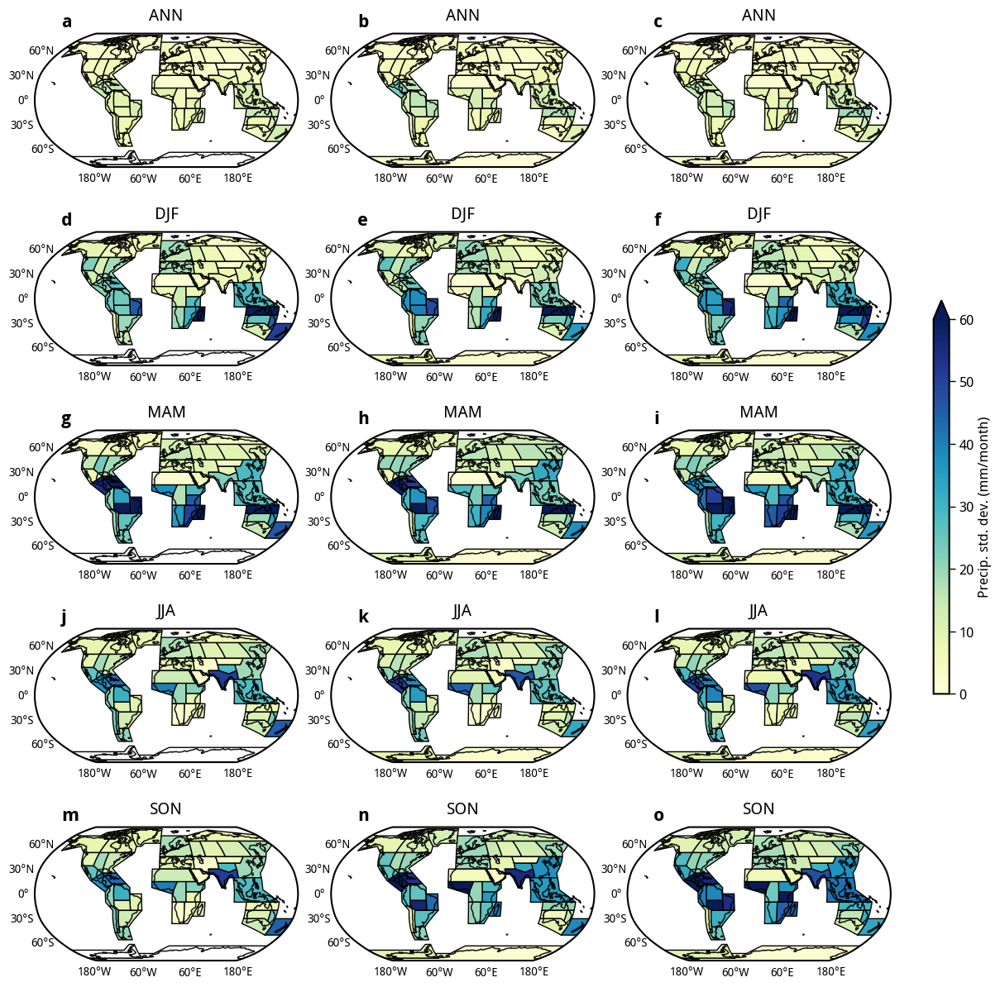

In [41]:
plot(std_list, title_list, labels_list, mpl.cm.YlGnBu, vmin=0, vmax=60, extend='max', cbar_shrink=0.4, cbar_label = 'Precip. std. dev. (mm/month)', pval = [], \
     nrows=5, ncols=3, figsize=(12,12), ocean_mask_list = np.arange(0, 20, 1), mme_index_list=mme_index_list)
plt.savefig(save_loc+'/supplementary/obs_rean_mmm_std_dev.png', dpi=300, bbox_inches='tight')

#### corr

In [42]:
corr_list = [out.isel(season = 0, model = -2).corr_coef, out.isel(season = 0, model = -1).corr_coef, mme_ds.isel(season=0).corr_coef,
             out.isel(season = 1, model = -2).corr_coef, out.isel(season = 1, model = -1).corr_coef, mme_ds.isel(season=1).corr_coef,
             out.isel(season = 2, model = -2).corr_coef, out.isel(season = 2, model = -1).corr_coef, mme_ds.isel(season=2).corr_coef,
             out.isel(season = 3, model = -2).corr_coef, out.isel(season = 3, model = -1).corr_coef, mme_ds.isel(season=3).corr_coef,
             out.isel(season = 3, model = -2).corr_coef, out.isel(season = 4, model = -1).corr_coef, mme_ds.isel(season=4).corr_coef]

In [50]:
pval_list = [out.isel(season = 0, model = -2).pval, out.isel(season = 0, model = -1).pval, mme_ds.isel(season=0).sign_ratio,
             out.isel(season = 1, model = -2).pval, out.isel(season = 1, model = -1).pval, mme_ds.isel(season=1).sign_ratio,
             out.isel(season = 2, model = -2).pval, out.isel(season = 2, model = -1).pval, mme_ds.isel(season=2).sign_ratio,
             out.isel(season = 3, model = -2).pval, out.isel(season = 3, model = -1).pval, mme_ds.isel(season=3).sign_ratio,
             out.isel(season = 3, model = -2).pval, out.isel(season = 4, model = -1).pval, mme_ds.isel(season=4).sign_ratio]

In [99]:
title_list = ['ANN', 'ANN', 'ANN',
              'DJF', 'DJF', 'DJF',
              'MAM', 'MAM', 'MAM',
              'JJA', 'JJA', 'JJA',
              'SON', 'SON', 'SON']

labels_list = ['a', 'b', 'c',
               'd', 'e', 'f',
               'g', 'h', 'i',
               'j', 'k', 'l',
               'm', 'n', 'o']

mme_index_list = [2, 5, 8, 11, 14]

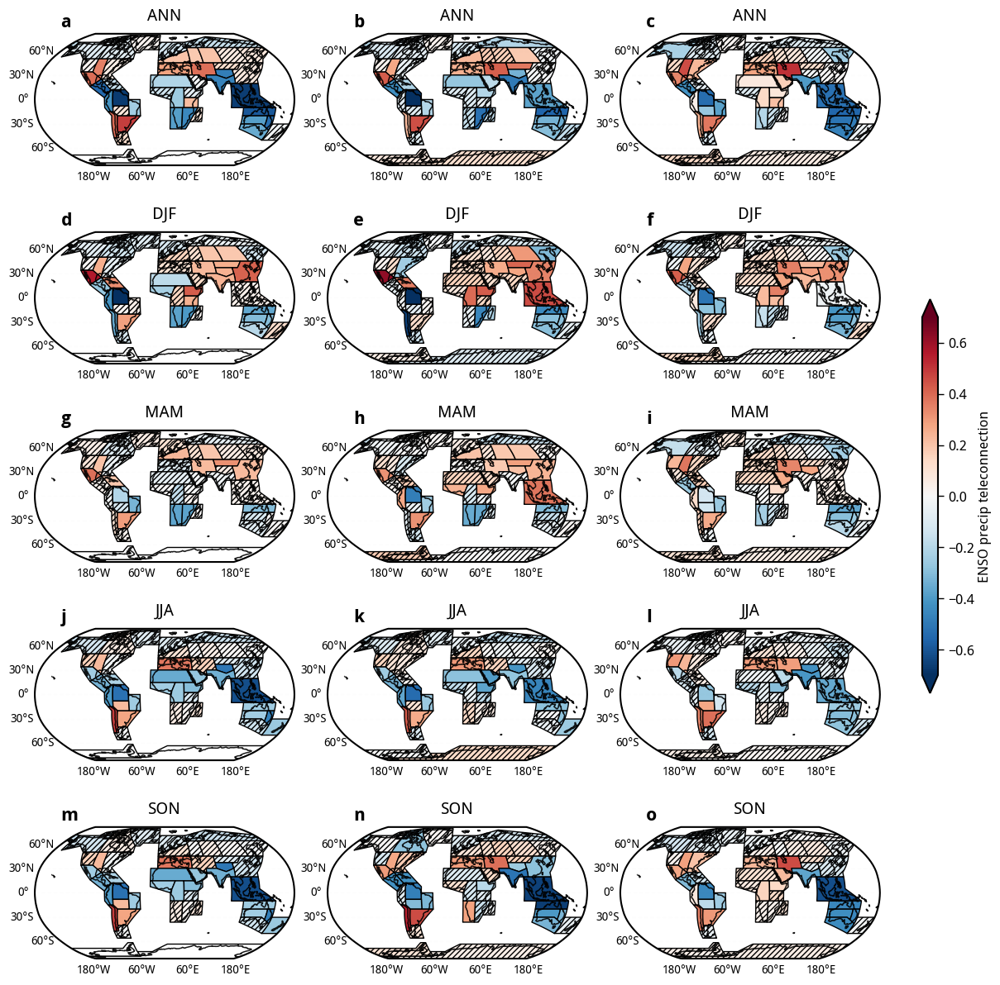

In [48]:
plot(corr_list, title_list, labels_list, mpl.cm.RdBu_r, vmin=-0.7, vmax=0.7, cbar_label = 'ENSO precip teleconnection', pval = pval_list, \
     nrows=5, ncols=3, figsize=(12,12), ocean_mask_list = np.arange(0, 20, 1), mme_index_list=mme_index_list)
plt.savefig(save_loc+'/supplementary/obs_rean_mmm_corr.png', dpi=300, bbox_inches='tight')

#### ANN figures

In [46]:
plot_list = [out.isel(season = 0, model = -2).nino, out.isel(season = 0, model = -1).nino, mme_ds.isel(season=0).nino,
             out.isel(season = 0, model = -2).nina, out.isel(season = 0, model = -1).nina, mme_ds.isel(season=0).nina,
             out.isel(season = 0, model = -2).neut, out.isel(season = 0, model = -1).neut, mme_ds.isel(season=0).neut,]

In [47]:
pval_list = [out.isel(season = 0, model = -2).pval, out.isel(season = 0, model = -1).pval, mme_ds.isel(season=0).sign_ratio,
             out.isel(season = 0, model = -2).pval, out.isel(season = 0, model = -1).pval, mme_ds.isel(season=0).sign_ratio,
             out.isel(season = 0, model = -2).pval, out.isel(season = 0, model = -1).pval, mme_ds.isel(season=0).sign_ratio,]

In [48]:
title_list = ['EN', 'EN', 'EN',
              'LN', 'LN', 'LN',
              'NEUT', 'NEUT', 'NEUT']

labels_list = ['a', 'b', 'c',
               'd', 'e', 'f',
               'g', 'h', 'i']

mme_index_list = [2, 5, 8, 11, 14]

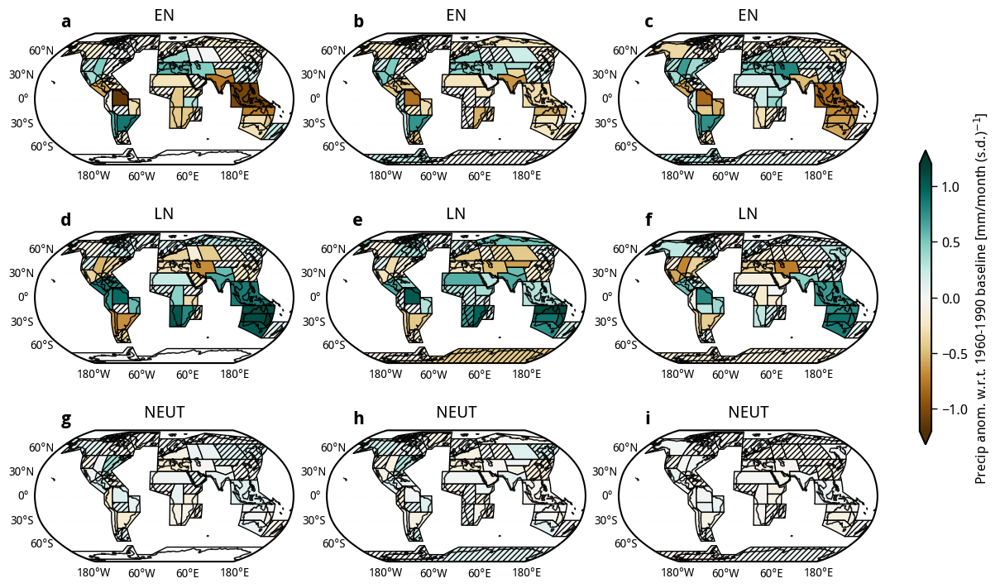

In [49]:
plot(plot_list, title_list, labels_list, mpl.cm.BrBG, vmin=-1.2, vmax=1.2, cbar_shrink=0.5, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline [mm/month (s.d.)$^{-1}$]', pval = pval_list, \
     nrows=3, ncols=3, figsize=(12,7.2), ocean_mask_list = np.arange(0, 20, 1), mme_index_list=mme_index_list)
plt.savefig(save_loc+'/ann_figures/obs_rean_mmm_enso_state.png', dpi=300, bbox_inches='tight')

In [57]:
plot_list = [out.isel(season = 0, model = -2).enc, out.isel(season=0, model=-1).enc, mme_ds.isel(season=0).enc,
             out.isel(season = 0, model = -2).lnc, out.isel(season=0, model=-1).lnc, mme_ds.isel(season=0).lnc]

In [58]:
pval_list = [out.isel(season = 0, model = -2).enc_pval, out.isel(season=0, model=-1).enc_pval, mme_ds.isel(season=0).enc_sign_ratio,
             out.isel(season = 0, model = -2).lnc_pval, out.isel(season=0, model=-1).lnc_pval, mme_ds.isel(season=0).lnc_sign_ratio]

In [59]:
title_list = ['ENC', 'ENC', 'ENC',
              'LNC', 'LNC', 'LNC']
labels_list = ['a', 'b', 'c',
               'd', 'e', 'f']

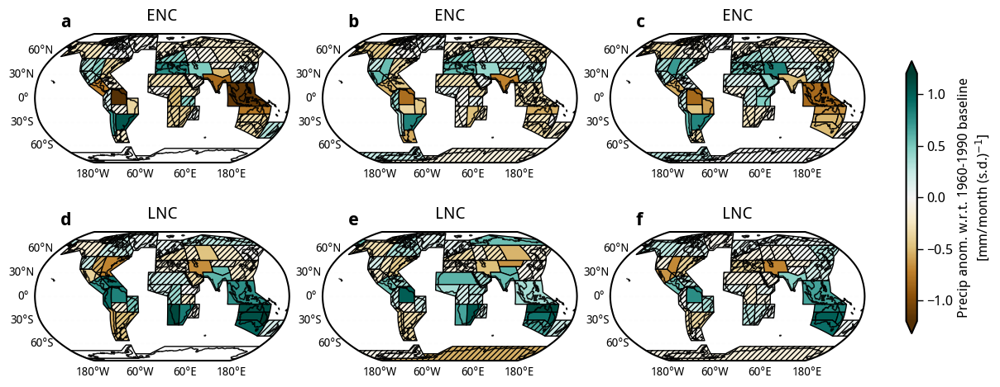

In [60]:
plot(plot_list, title_list, labels_list, mpl.cm.BrBG, vmin=-1.2, vmax=1.2, cbar_shrink=0.7, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline\n[mm/month (s.d.)$^{-1}$]', pval = pval_list, \
     nrows=2, ncols=3, figsize=(12,4.8), ocean_mask_list = np.arange(0, 15, 1), mme_index_list=mme_index_list)
plt.savefig(save_loc+'/ann_figures/obs_rean_mmm_enso_change.png', dpi=300, bbox_inches='tight')

In [61]:
plot_list = [out.isel(season = 0, model = -2).asymm, out.isel(season=0, model=-1).asymm, mme_ds.isel(season=0).asymm]

In [62]:
pval_list1 = [out.isel(season = 0, model = -2).enc_pval, out.isel(season = 0, model = -1).enc_pval, mme_ds.isel(season=0).enc_sign_ratio]
pval_list2 = [out.isel(season = 0, model = -2).lnc_pval, out.isel(season = 0, model = -1).lnc_pval, mme_ds.isel(season=0).lnc_sign_ratio]
# pval_list = [out.isel(season = 0, model = -2).pval.to_numpy(), out.isel(season = 0, model = -1).pval.to_numpy()]

In [63]:
title_list = ['ASYMM', 'ASYMM', 'ASYMM']
labels_list = ['g', 'h', 'i']

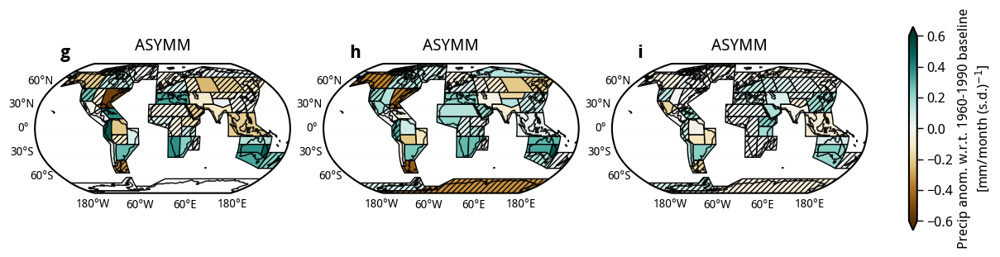

In [67]:
plot2(plot_list, title_list, labels_list, mpl.cm.BrBG, vmin=-0.6, vmax=0.6, cbar_shrink=0.7, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline\n[mm/month (s.d.)$^{-1}$]', pval1 = pval_list1, \
     pval2 = pval_list2, nrows=1, ncols=3, figsize=(12,3.6), ocean_mask_list = np.arange(0, 15, 1), mme_index_list=mme_index_list)
plt.savefig(save_loc+'/ann_figures/obs_rean_mmm_asymm.png', dpi=300, bbox_inches='tight')

#### seasonal figures

In [87]:
plot_list = [out.isel(season = 1, model = -2).nino, 
             out.isel(season = 2, model = -2).nino,
             out.isel(season = 3, model = -2).nino,
             out.isel(season = 4, model = -2).nino,
             out.isel(season = 1, model = -2).nina,
             out.isel(season = 2, model = -2).nina,
             out.isel(season = 3, model = -2).nina,
             out.isel(season = 4, model = -2).nina,
             out.isel(season = 1, model = -2).neut,
             out.isel(season = 2, model = -2).neut,
             out.isel(season = 3, model = -2).neut,
             out.isel(season = 4, model = -2).neut]

In [88]:
pval_list = [out.isel(season = 1, model = -2).pval, 
             out.isel(season = 2, model = -2).pval,
             out.isel(season = 3, model = -2).pval,
             out.isel(season = 4, model = -2).pval,
             out.isel(season = 1, model = -2).pval,
             out.isel(season = 2, model = -2).pval,
             out.isel(season = 3, model = -2).pval,
             out.isel(season = 4, model = -2).pval,
             out.isel(season = 1, model = -2).pval,
             out.isel(season = 2, model = -2).pval,
             out.isel(season = 3, model = -2).pval,
             out.isel(season = 4, model = -2).pval]

In [89]:
title_list = ['DJF NINO', 'MAM NINO', 'JJA NINO', 'SON NINO',
              'DJF NINA', 'MAM NINA', 'JJA NINA', 'SON NINA',
              'DJF NEUT', 'MAM NEUT', 'JJA NEUT', 'SON NEUT']

labels_list = ['a', 'b', 'c',
               'd', 'e', 'f',
               'g', 'h', 'i',
               'j', 'k', 'l',
               'm', 'n', 'o']

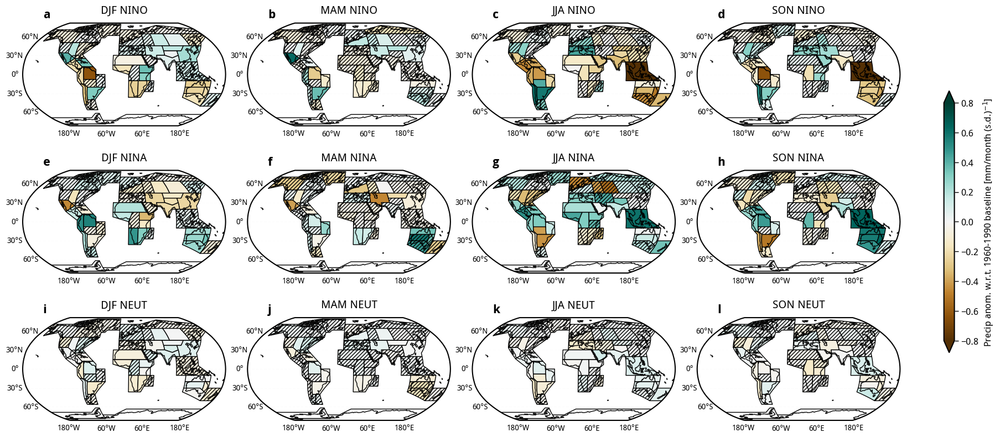

In [90]:
plot(plot_list, title_list, labels_list, mpl.cm.BrBG, vmin=-0.8, vmax=0.8, cbar_shrink=0.6, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline [mm/month (s.d.)$^{-1}$]', pval = pval_list, \
     nrows=3, ncols=4, figsize=(18,8), ocean_mask_list = np.arange(0, 20, 1), mme_index_list=[])
plt.savefig(save_loc+'/seasonal_figures/obs_enso_state.png', dpi=300, bbox_inches='tight')

In [91]:
plot_list = [out.isel(season = 1, model = -1).nino, 
             out.isel(season = 2, model = -1).nino,
             out.isel(season = 3, model = -1).nino,
             out.isel(season = 4, model = -1).nino,
             out.isel(season = 1, model = -1).nina,
             out.isel(season = 2, model = -1).nina,
             out.isel(season = 3, model = -1).nina,
             out.isel(season = 4, model = -1).nina,
             out.isel(season = 1, model = -1).neut,
             out.isel(season = 2, model = -1).neut,
             out.isel(season = 3, model = -1).neut,
             out.isel(season = 4, model = -1).neut]

In [92]:
pval_list = [out.isel(season = 1, model = -1).pval, 
             out.isel(season = 2, model = -1).pval,
             out.isel(season = 3, model = -1).pval,
             out.isel(season = 4, model = -1).pval,
             out.isel(season = 1, model = -1).pval,
             out.isel(season = 2, model = -1).pval,
             out.isel(season = 3, model = -1).pval,
             out.isel(season = 4, model = -1).pval,
             out.isel(season = 1, model = -1).pval,
             out.isel(season = 2, model = -1).pval,
             out.isel(season = 3, model = -1).pval,
             out.isel(season = 4, model = -1).pval]

In [93]:
title_list = ['DJF NINO', 'MAM NINO', 'JJA NINO', 'SON NINO',
              'DJF NINA', 'MAM NINA', 'JJA NINA', 'SON NINA',
              'DJF NEUT', 'MAM NEUT', 'JJA NEUT', 'SON NEUT']

labels_list = ['a', 'b', 'c',
               'd', 'e', 'f',
               'g', 'h', 'i',
               'j', 'k', 'l',
               'm', 'n', 'o']

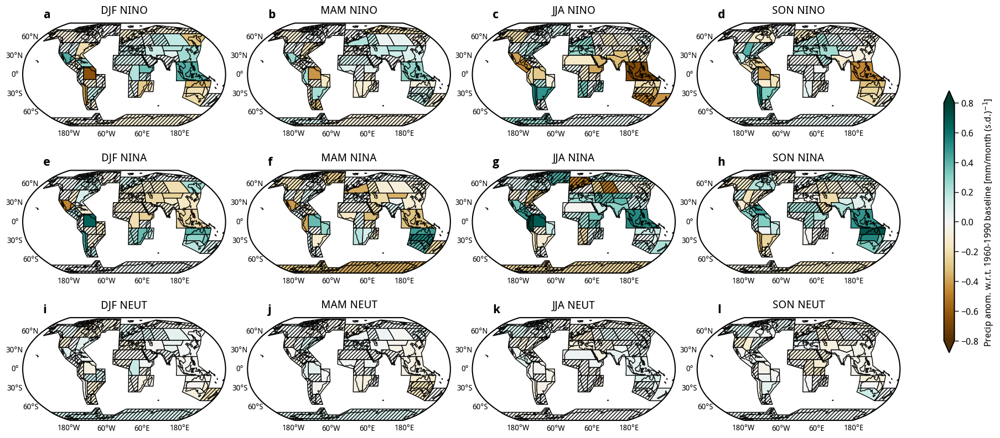

In [94]:
plot(plot_list, title_list, labels_list, mpl.cm.BrBG, vmin=-0.8, vmax=0.8, cbar_shrink=0.6, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline [mm/month (s.d.)$^{-1}$]', pval = pval_list, \
     nrows=3, ncols=4, figsize=(18,8), ocean_mask_list = np.arange(0, 20, 1), mme_index_list=[])
plt.savefig(save_loc+'/seasonal_figures/rean_enso_state.png', dpi=300, bbox_inches='tight')

In [102]:
plot_list = [mme_ds.isel(season = 1).nino, 
             mme_ds.isel(season = 2).nino,
             mme_ds.isel(season = 3).nino,
             mme_ds.isel(season = 4).nino,
             mme_ds.isel(season = 1).nina,
             mme_ds.isel(season = 2).nina,
             mme_ds.isel(season = 3).nina,
             mme_ds.isel(season = 4).nina,
             mme_ds.isel(season = 1).neut,
             mme_ds.isel(season = 2).neut,
             mme_ds.isel(season = 3).neut,
             mme_ds.isel(season = 4).neut]

In [103]:
pval_list = [mme_ds.isel(season = 1).sign_ratio, 
             mme_ds.isel(season = 2).sign_ratio,
             mme_ds.isel(season = 3).sign_ratio,
             mme_ds.isel(season = 4).sign_ratio,
             mme_ds.isel(season = 1).sign_ratio,
             mme_ds.isel(season = 2).sign_ratio,
             mme_ds.isel(season = 3).sign_ratio,
             mme_ds.isel(season = 4).sign_ratio,
             mme_ds.isel(season = 1).sign_ratio,
             mme_ds.isel(season = 2).sign_ratio,
             mme_ds.isel(season = 3).sign_ratio,
             mme_ds.isel(season = 4).sign_ratio]

In [104]:
title_list = ['DJF NINO', 'MAM NINO', 'JJA NINO', 'SON NINO',
              'DJF NINA', 'MAM NINA', 'JJA NINA', 'SON NINA',
              'DJF NEUT', 'MAM NEUT', 'JJA NEUT', 'SON NEUT']

labels_list = ['a', 'b', 'c',
               'd', 'e', 'f',
               'g', 'h', 'i',
               'j', 'k', 'l',
               'm', 'n', 'o']

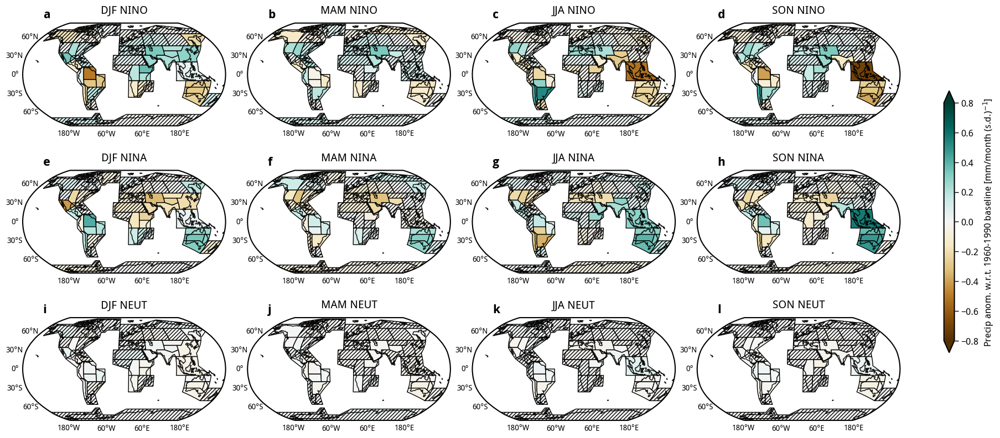

In [105]:
plot(plot_list, title_list, labels_list, mpl.cm.BrBG, vmin=-0.8, vmax=0.8, cbar_shrink=0.6, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline [mm/month (s.d.)$^{-1}$]', pval = pval_list, \
     nrows=3, ncols=4, figsize=(18,8), ocean_mask_list = np.arange(0, 20, 1), mme_index_list=np.arange(0,20,1))
plt.savefig(save_loc+'/seasonal_figures/mme_enso_state.png', dpi=300, bbox_inches='tight')

In [106]:
plot_list = [out.isel(season = 1, model = -2).enc, 
             out.isel(season = 2, model = -2).enc,
             out.isel(season = 3, model = -2).enc,
             out.isel(season = 4, model = -2).enc,
             out.isel(season = 1, model = -2).lnc,
             out.isel(season = 2, model = -2).lnc,
             out.isel(season = 3, model = -2).lnc,
             out.isel(season = 4, model = -2).lnc]

In [107]:
pval_list = [out.isel(season = 1, model = -2).enc_pval, 
             out.isel(season = 2, model = -2).enc_pval,
             out.isel(season = 3, model = -2).enc_pval,
             out.isel(season = 4, model = -2).enc_pval,
             out.isel(season = 1, model = -2).lnc_pval,
             out.isel(season = 2, model = -2).lnc_pval,
             out.isel(season = 3, model = -2).lnc_pval,
             out.isel(season = 4, model = -2).lnc_pval]

In [108]:
title_list = ['DJF ENC', 'MAM ENC', 'JJA ENC', 'SON ENC',
              'DJF LNC', 'MAM LNC', 'JJA LNC', 'SON LNC']

labels_list = ['a', 'b', 'c',
               'd', 'e', 'f',
               'g', 'h', 'i',
               'j', 'k', 'l',
               'm', 'n', 'o']

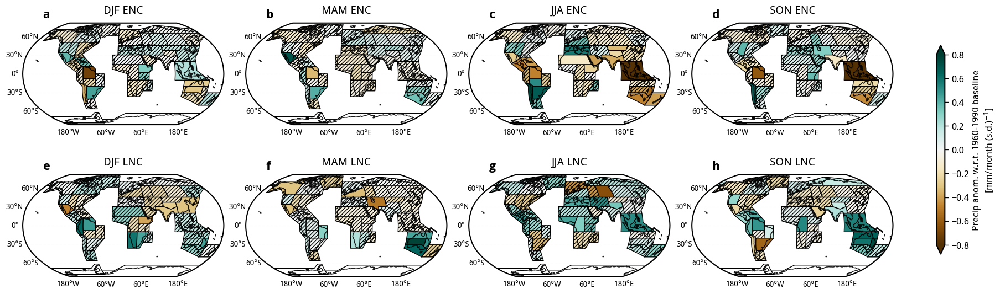

In [111]:
plot(plot_list, title_list, labels_list, mpl.cm.BrBG, vmin=-0.8, vmax=0.8, cbar_shrink=0.7, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline\n[mm/month (s.d.)$^{-1}$]', pval = pval_list, \
     nrows=2, ncols=4, figsize=(18,5.5), ocean_mask_list = np.arange(0, 20, 1), mme_index_list=[])
plt.savefig(save_loc+'/seasonal_figures/obs_enso_change.png', dpi=300, bbox_inches='tight')

In [112]:
plot_list = [out.isel(season = 1, model = -1).enc, 
             out.isel(season = 2, model = -1).enc,
             out.isel(season = 3, model = -1).enc,
             out.isel(season = 4, model = -1).enc,
             out.isel(season = 1, model = -1).lnc,
             out.isel(season = 2, model = -1).lnc,
             out.isel(season = 3, model = -1).lnc,
             out.isel(season = 4, model = -1).lnc]

In [113]:
pval_list = [out.isel(season = 1, model = -1).enc_pval, 
             out.isel(season = 2, model = -1).enc_pval,
             out.isel(season = 3, model = -1).enc_pval,
             out.isel(season = 4, model = -1).enc_pval,
             out.isel(season = 1, model = -1).lnc_pval,
             out.isel(season = 2, model = -1).lnc_pval,
             out.isel(season = 3, model = -1).lnc_pval,
             out.isel(season = 4, model = -1).lnc_pval]

In [114]:
title_list = ['DJF ENC', 'MAM ENC', 'JJA ENC', 'SON ENC',
              'DJF LNC', 'MAM LNC', 'JJA LNC', 'SON LNC']

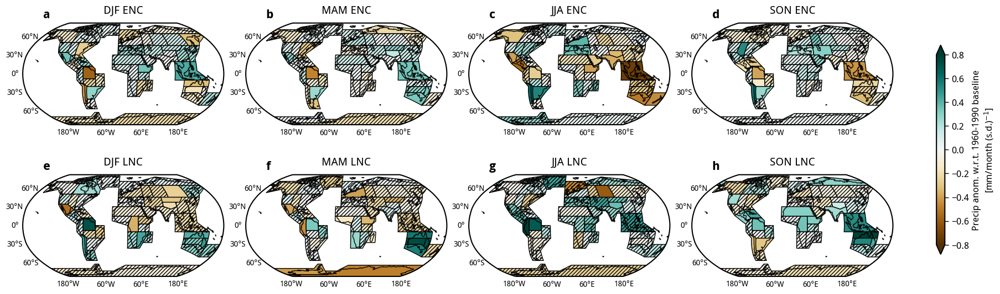

In [115]:
plot(plot_list, title_list, labels_list, mpl.cm.BrBG, vmin=-0.8, vmax=0.8, cbar_shrink=0.7, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline\n[mm/month (s.d.)$^{-1}$]', pval = pval_list, \
     nrows=2, ncols=4, figsize=(18,5.5), ocean_mask_list = np.arange(0, 20, 1), mme_index_list=[])
plt.savefig(save_loc+'/seasonal_figures/rean_enso_change.png', dpi=300, bbox_inches='tight')

In [116]:
plot_list = [mme_ds.isel(season = 1).enc, 
             mme_ds.isel(season = 2).enc,
             mme_ds.isel(season = 3).enc,
             mme_ds.isel(season = 4).enc,
             mme_ds.isel(season = 1).lnc,
             mme_ds.isel(season = 2).lnc,
             mme_ds.isel(season = 3).lnc,
             mme_ds.isel(season = 4).lnc]

In [117]:
pval_list = [mme_ds.isel(season = 1).enc_sign_ratio, 
             mme_ds.isel(season = 2).enc_sign_ratio,
             mme_ds.isel(season = 3).enc_sign_ratio,
             mme_ds.isel(season = 4).enc_sign_ratio,
             mme_ds.isel(season = 1).lnc_sign_ratio,
             mme_ds.isel(season = 2).lnc_sign_ratio,
             mme_ds.isel(season = 3).lnc_sign_ratio,
             mme_ds.isel(season = 4).lnc_sign_ratio]

In [118]:
title_list = ['DJF ENC', 'MAM ENC', 'JJA ENC', 'SON ENC',
              'DJF LNC', 'MAM LNC', 'JJA LNC', 'SON LNC']

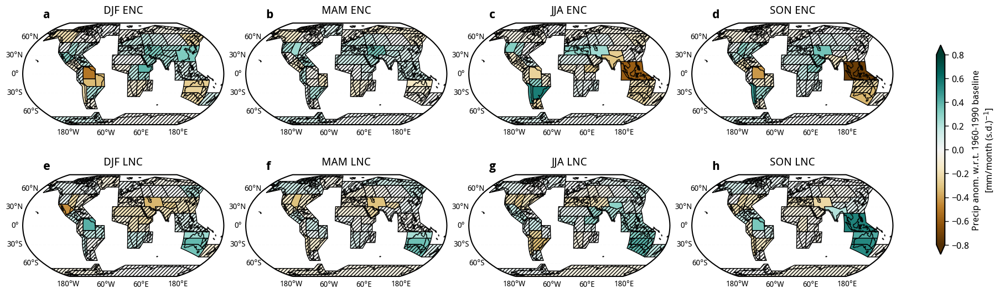

In [119]:
plot(plot_list, title_list, labels_list, mpl.cm.BrBG, vmin=-0.8, vmax=0.8, cbar_shrink=0.7, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline\n[mm/month (s.d.)$^{-1}$]', pval = pval_list, \
     nrows=2, ncols=4, figsize=(18,5.5), ocean_mask_list = np.arange(0, 20, 1), mme_index_list=np.arange(0, 20, 1))
plt.savefig(save_loc+'/seasonal_figures/mme_enso_change.png', dpi=300, bbox_inches='tight')

In [137]:
plot_list = [out.isel(season = 1, model = -2).asymm, 
             out.isel(season = 2, model = -2).asymm,
             out.isel(season = 3, model = -2).asymm,
             out.isel(season = 4, model = -2).asymm]

In [138]:
# pval_list = [out.isel(season = 1, model = -2).pval.to_numpy(), 
#              out.isel(season = 2, model = -2).pval.to_numpy(),
#              out.isel(season = 3, model = -2).pval.to_numpy(),
#              out.isel(season = 4, model = -2).pval.to_numpy(),
#              out.isel(season = 1, model = -1).pval.to_numpy(),
#              out.isel(season = 2, model = -1).pval.to_numpy(),
#              out.isel(season = 3, model = -1).pval.to_numpy(),
#              out.isel(season = 4, model = -1).pval.to_numpy()]

pval_list1 = [out.isel(season = 1, model = -2).enc_pval, 
              out.isel(season = 2, model = -2).enc_pval,
              out.isel(season = 3, model = -2).enc_pval,
              out.isel(season = 4, model = -2).enc_pval]

pval_list2 = [out.isel(season = 1, model = -2).lnc_pval, 
              out.isel(season = 2, model = -2).lnc_pval,
              out.isel(season = 3, model = -2).lnc_pval,
              out.isel(season = 4, model = -2).lnc_pval]

In [139]:
title_list = ['DJF ASYMM', 'MAM ASYMM', 'JJA ASYMM', 'SON ASYMM']

labels_list = ['i', 'j', 'k', 'l']

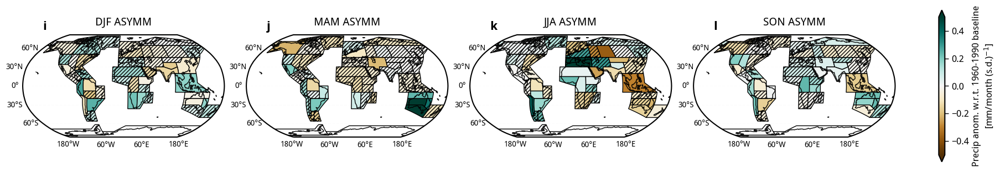

In [140]:
plot2(plot_list, title_list, labels_list, mpl.cm.BrBG, vmin=-0.5, vmax=0.5, cbar_shrink=0.7, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline\n[mm/month (s.d.)$^{-1}$]', pval1 = pval_list1, \
     pval2 = pval_list2, nrows=1, ncols=4, figsize=(18, 4), ocean_mask_list = np.arange(0, 15, 1), mme_index_list=[])
plt.savefig(save_loc+'/seasonal_figures/obs_asymm.png', dpi=300, bbox_inches='tight')

In [141]:
plot_list = [out.isel(season = 1, model = -1).asymm, 
             out.isel(season = 2, model = -1).asymm,
             out.isel(season = 3, model = -1).asymm,
             out.isel(season = 4, model = -1).asymm]

In [142]:
# pval_list = [out.isel(season = 1, model = -2).pval.to_numpy(), 
#              out.isel(season = 2, model = -2).pval.to_numpy(),
#              out.isel(season = 3, model = -2).pval.to_numpy(),
#              out.isel(season = 4, model = -2).pval.to_numpy(),
#              out.isel(season = 1, model = -1).pval.to_numpy(),
#              out.isel(season = 2, model = -1).pval.to_numpy(),
#              out.isel(season = 3, model = -1).pval.to_numpy(),
#              out.isel(season = 4, model = -1).pval.to_numpy()]

pval_list1 = [out.isel(season = 1, model = -1).enc_pval, 
              out.isel(season = 2, model = -1).enc_pval,
              out.isel(season = 3, model = -1).enc_pval,
              out.isel(season = 4, model = -1).enc_pval]

pval_list2 = [out.isel(season = 1, model = -1).lnc_pval, 
              out.isel(season = 2, model = -1).lnc_pval,
              out.isel(season = 3, model = -1).lnc_pval,
              out.isel(season = 4, model = -1).lnc_pval]

In [143]:
title_list = ['DJF ASYMM', 'MAM ASYMM', 'JJA ASYMM', 'SON ASYMM']

labels_list = ['i', 'j', 'k', 'l']

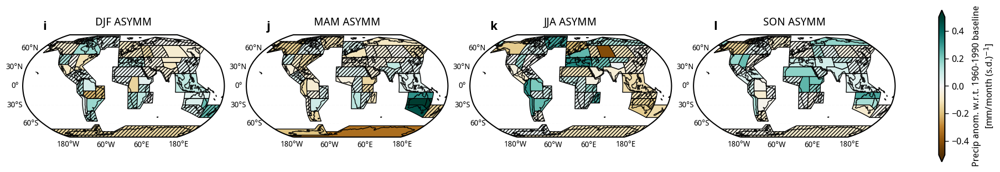

In [144]:
plot2(plot_list, title_list, labels_list, mpl.cm.BrBG, vmin=-0.5, vmax=0.5, cbar_shrink=0.7, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline\n[mm/month (s.d.)$^{-1}$]', pval1 = pval_list1, \
     pval2 = pval_list2, nrows=1, ncols=4, figsize=(18, 4), ocean_mask_list = np.arange(0, 15, 1), mme_index_list=[])
plt.savefig(save_loc+'/seasonal_figures/rean_asymm.png', dpi=300, bbox_inches='tight')

In [145]:
plot_list = [mme_ds.isel(season = 1).asymm, 
             mme_ds.isel(season = 2).asymm,
             mme_ds.isel(season = 3).asymm,
             mme_ds.isel(season = 4).asymm]

In [146]:
# pval_list = [out.isel(season = 1, model = -2).pval.to_numpy(), 
#              out.isel(season = 2, model = -2).pval.to_numpy(),
#              out.isel(season = 3, model = -2).pval.to_numpy(),
#              out.isel(season = 4, model = -2).pval.to_numpy(),
#              out.isel(season = 1, model = -1).pval.to_numpy(),
#              out.isel(season = 2, model = -1).pval.to_numpy(),
#              out.isel(season = 3, model = -1).pval.to_numpy(),
#              out.isel(season = 4, model = -1).pval.to_numpy()]

pval_list1 = [mme_ds.isel(season = 1).enc_sign_ratio, 
              mme_ds.isel(season = 2).enc_sign_ratio,
              mme_ds.isel(season = 3).enc_sign_ratio,
              mme_ds.isel(season = 4).enc_sign_ratio]

pval_list2 = [mme_ds.isel(season = 1).lnc_sign_ratio, 
              mme_ds.isel(season = 2).lnc_sign_ratio,
              mme_ds.isel(season = 3).lnc_sign_ratio,
              mme_ds.isel(season = 4).lnc_sign_ratio]

In [147]:
title_list = ['DJF ASYMM', 'MAM ASYMM', 'JJA ASYMM', 'SON ASYMM']

labels_list = ['i', 'j', 'k', 'l']

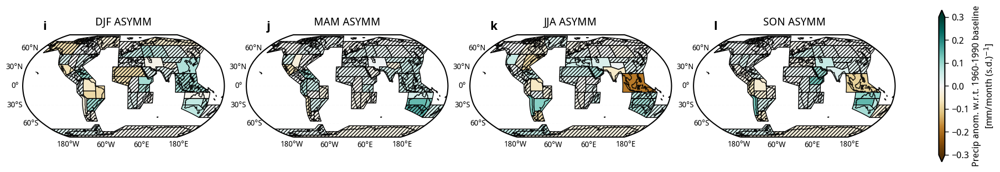

In [149]:
plot2(plot_list, title_list, labels_list, mpl.cm.BrBG, vmin=-0.3, vmax=0.3, cbar_shrink=0.7, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline\n[mm/month (s.d.)$^{-1}$]', pval1 = pval_list1, \
     pval2 = pval_list2, nrows=1, ncols=4, figsize=(18, 4), ocean_mask_list = np.arange(0, 15, 1), mme_index_list=np.arange(0,15,1))
plt.savefig(save_loc+'/seasonal_figures/mme_asymm.png', dpi=300, bbox_inches='tight')